In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scanpy as sc
from scipy import stats
import os

from scipy import spatial
from scipy import sparse
from scipy.interpolate import CubicSpline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import networkx as nx
from umap import UMAP

import json

In [2]:
import importlib

from scroutines import powerplots
from scroutines.miscu import is_in_polygon

import utils_merfish
importlib.reload(utils_merfish)
from utils_merfish import rot2d, st_scatter, plot_cluster, binning
from utils_merfish import RefLineSegs

from merfish_datasets import merfish_datasets
directories = merfish_datasets
directories

{'P14NR_ant': 'merfish_06142023/ant/region0',
 'P28NR_ant': 'merfish_06142023/ant/region1',
 'P14NR_pos': 'merfish_06142023/pos/region0',
 'P28NR_pos': 'merfish_06142023/pos/region1',
 'P21NR_ant': 'merfish_20231114/region0',
 'P21DR_ant': 'merfish_20231114/region2',
 'P28DR_ant': 'merfish_20231114/region1',
 'P21NR_pos': 'merfish_20231120/region0',
 'P21DR_pos': 'merfish_20231120/region1',
 'P28DR_pos': 'merfish_20231120/region2'}

# load input

In [3]:
np.random.seed(0)

In [4]:
xy_operations = {
    'rotation': None,
    'ref_line': None,
}

In [5]:
outdir     = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240227"
outdatadir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized"
!mkdir -p $outdir
!mkdir -p $outdatadir

In [6]:
name = 'P28DR_pos'
dirc = directories[name]

f1 = os.path.join('/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish', dirc, 'cell_by_gene.csv')
f2 = os.path.join('/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish', dirc, 'cell_metadata.csv')
output      = outdatadir + f'/{name}_ctxglut_240318.h5ad'
output_json = outdatadir + f'/{name}_ctxglut_240318_xy_operations.json'

df1 = pd.read_csv(f1)
df2 = pd.read_csv(f2)

df1.shape, df2.shape

((137991, 551), (137991, 29))

In [7]:
genes = df1.iloc[:,1:-50].columns
blnks = df1.iloc[:, -50:].columns

df = df2.join(df1)
assert np.all(df['cell'] == df['EntityID'])
len(genes), len(blnks)

df['fpcov'] = df[blnks].sum(axis=1)
df['gncov'] = df[genes].sum(axis=1)

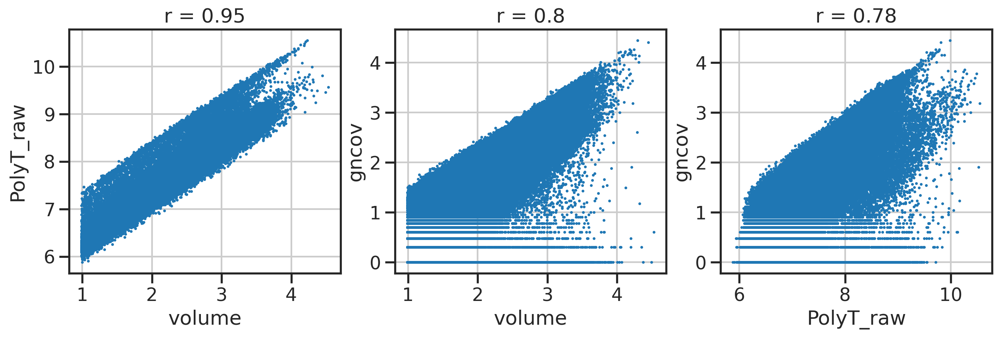

In [8]:
factors = np.array(['volume', 'PolyT_raw', 'gncov'])
pairs = [[0,1], [0,2], [1,2]]


fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for pair, ax in zip(pairs, axs):
    f0 = factors[pair[0]]
    f1 = factors[pair[1]]
    x, y = np.log10(1+df[f0]), np.log10(1+df[f1])
    r, p = stats.pearsonr(x, y)
    ax.scatter(x, y, s=1)
    ax.set_xlabel(f0)
    ax.set_ylabel(f1)
    ax.set_title(f'r = {r:.2g}')
    
plt.show()

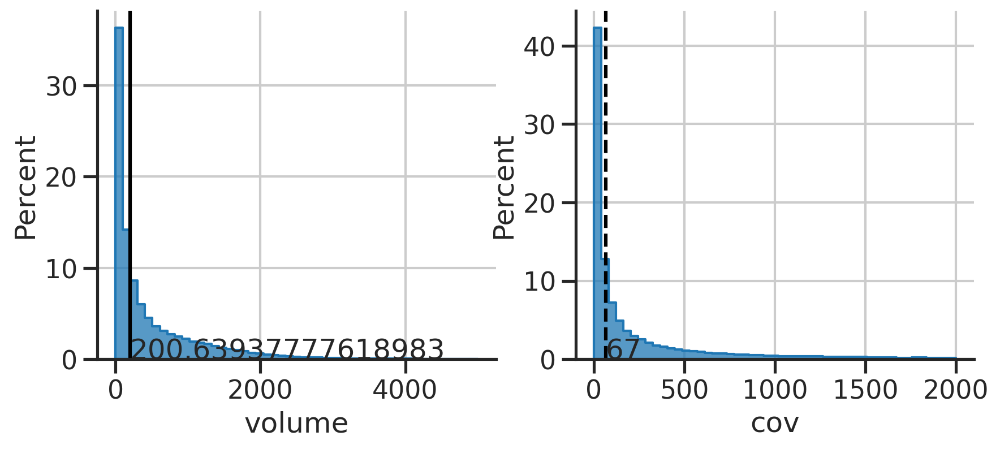

In [9]:
vol = df['volume'].values
medvol = np.median(vol)

cov = df['gncov'].values
medcov = np.median(cov)

fig, axs = plt.subplots(1,2,figsize=(2*5,1*4))
ax = axs[0]
sns.histplot(vol, element='step', bins=np.linspace(0,5000,50), ax=ax, stat='percent')
sns.despine(ax=ax)
ax.axvline(medvol, color='k',)
ax.text(medvol, 0, medvol)
ax.set_xlabel('volume')

ax = axs[1]
sns.histplot(cov, element='step', bins=np.linspace(0,2000,50), ax=ax, stat='percent')
sns.despine(ax=ax)
ax.text(medcov, 0, int(medcov))
ax.axvline(medcov, color='k', linestyle='--')
ax.set_xlabel('cov')
plt.show()

# basic QC and rotation

In [10]:
print(df.shape)
cond = np.all([
    df['volume'] < 2000, 
    df['volume'] > 50, 
    df['fpcov'] < 5,
    df['gncov'] > 10,
], axis=0)

df = df[cond] 
print(df.shape)

(137991, 582)
(77700, 582)


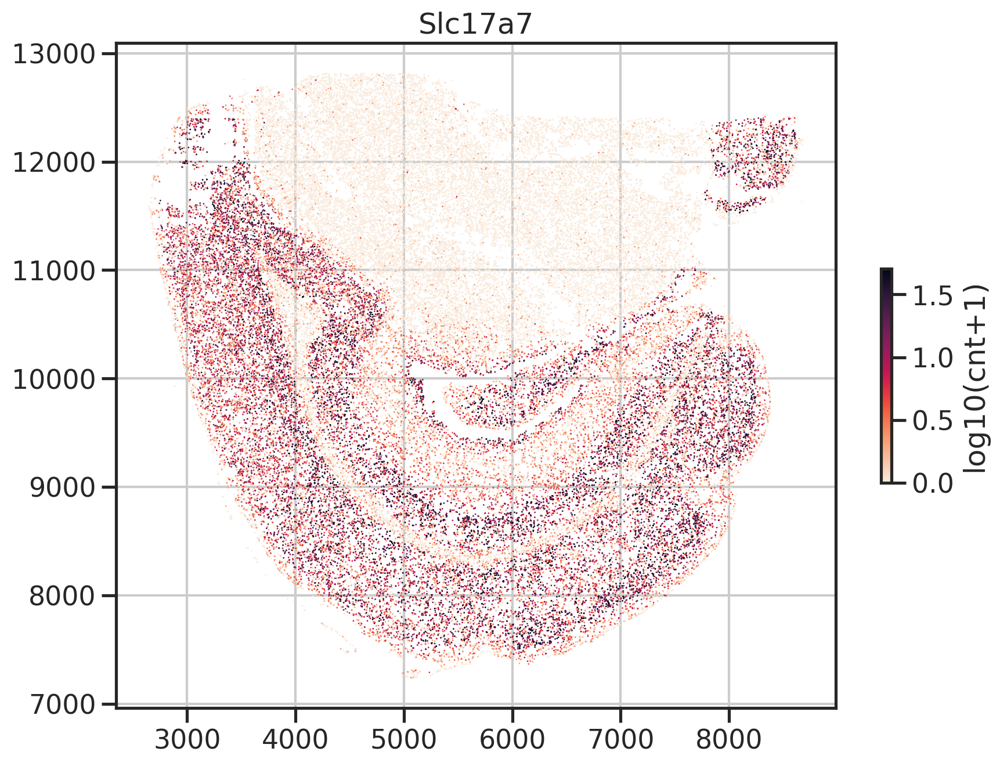

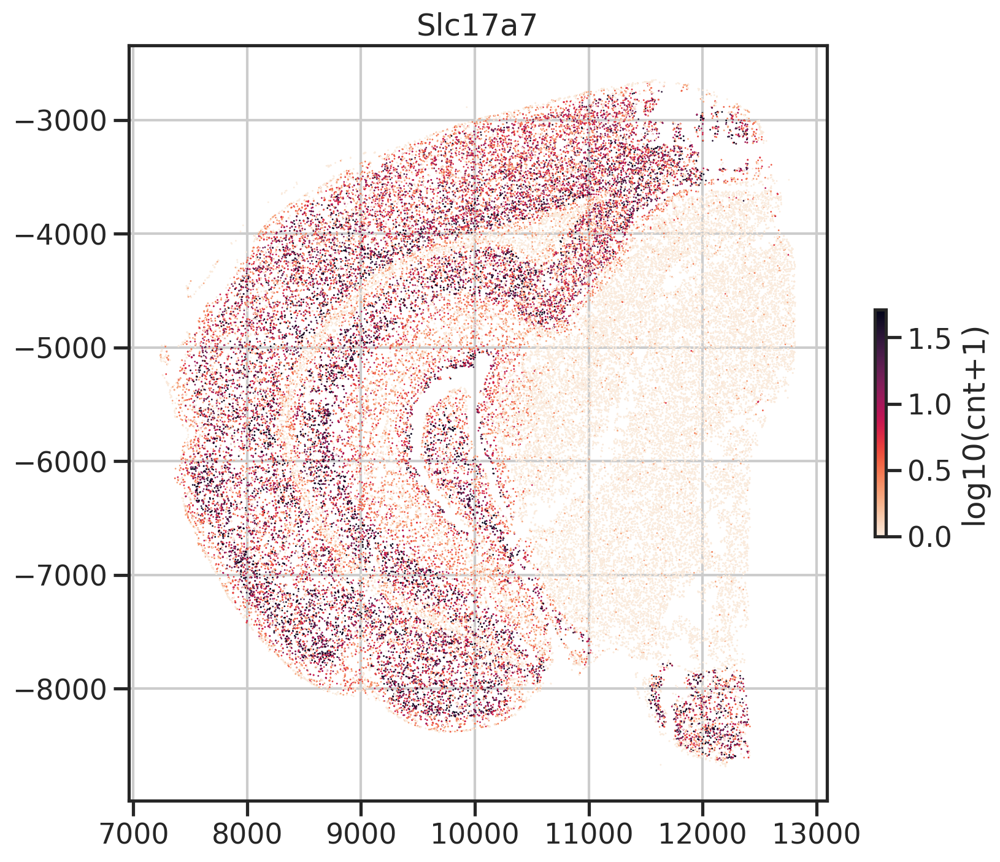

In [11]:
# calibrate coordinates

rotation = -90
xy_operations['rotation'] = rotation

x = df['center_x']
y = df['center_y']
xr, yr = rot2d(x, y, rotation)
df['x'] = xr
df['y'] = yr

gn = 'Slc17a7'
g = np.log10(1+df[gn])
st_scatter(x, y, gexp=g, title=gn, cbar_label='log10(cnt+1)', axis_off=False)
st_scatter(xr, yr, gexp=g, title=gn, cbar_label='log10(cnt+1)', axis_off=False)

In [12]:
metacols = np.hstack(['x', 'y', 'gncov', 'fpcov', df2.columns])
adata = ad.AnnData(X=df[genes].values, 
                   obs=df[metacols], 
                   var=pd.DataFrame(index=genes), 
                   obsm=dict(blanks=df[blnks].values),
                  )

/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


# spatial

In [13]:
k = 100
dist_th = 80

meta = adata.obs.copy()
XY = meta[['x', 'y']].values
nc = len(XY)

# kNN
nbrs = NearestNeighbors(n_neighbors=k, algorithm='auto').fit(XY)
distances, indices = nbrs.kneighbors(XY)

# filtered by distance th
val = distances[:,1:].reshape(-1,)
i = np.repeat(indices[:,0],k-1)
j = indices[:,1:].reshape(-1,)

indices_filtered = np.vstack([i[val < dist_th], j[val < dist_th]]).T

G = nx.Graph()
G.add_nodes_from(np.arange(nc))
G.add_edges_from(indices_filtered)
components = nx.connected_components(G)
largest_component = max(components, key=len)

print(len(largest_component)/nc)

0.998043758043758


Text(0.5, 1.0, 'P28 anterior')

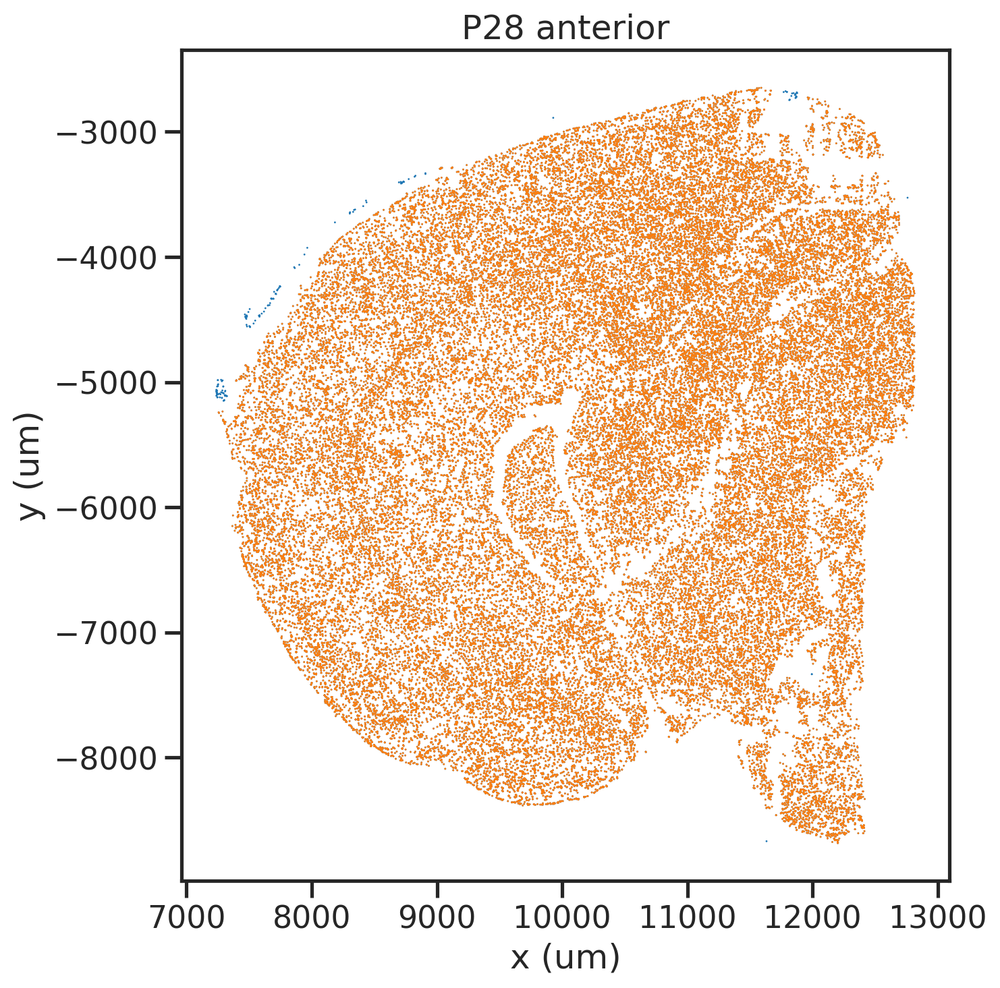

In [14]:
indices_selected = np.array(list(largest_component))
fig, ax = plt.subplots(figsize=(12,8))
    
ax.scatter(XY[:,0], XY[:,1], edgecolor='none', s=1)
ax.scatter(XY[:,0][indices_selected], 
           XY[:,1][indices_selected], edgecolor='none', s=1)

ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'P28 anterior')

In [15]:
adatasub = adata[indices_selected]
adatasub

View of AnnData object with n_obs × n_vars = 77548 × 500
    obs: 'x', 'y', 'gncov', 'fpcov', 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'DreO_raw', 'DreO_high_pass', 'Cre_raw', 'Cre_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'FlpO_raw', 'FlpO_high_pass', 'Pvalb_raw', 'Pvalb_high_pass', 'Sst_raw', 'Sst_high_pass', 'Fth1_raw', 'Fth1_high_pass', 'PolyT_raw', 'PolyT_high_pass'
    obsm: 'blanks'

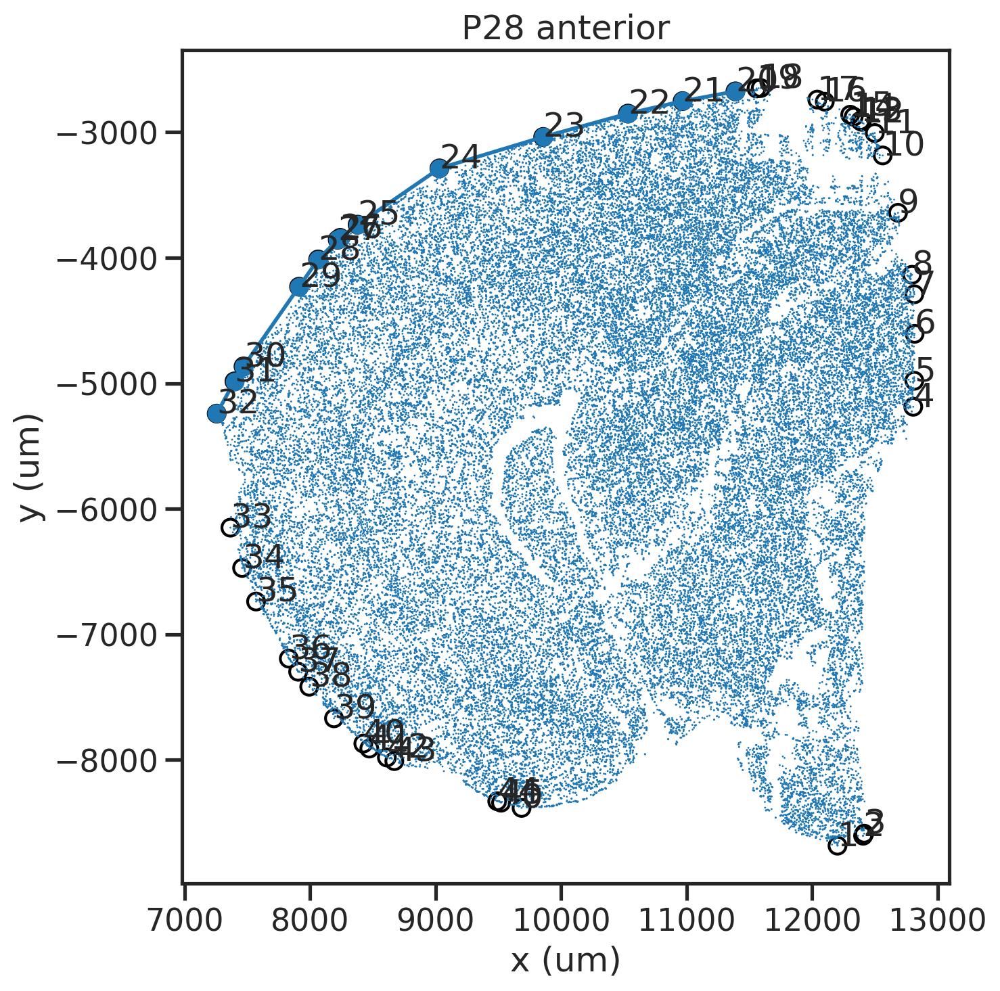

In [16]:
meta = adatasub.obs.copy()
XY = meta[['x', 'y']].values
nc = len(XY)

# convex hull
hull = spatial.ConvexHull(XY)
pia_vtx = hull.vertices[20:33][::-1]
pia_curve = XY[pia_vtx]
x = pia_curve[:,0]
y = pia_curve[:,1]

fig, ax = plt.subplots(figsize=(12,8))
for i, vtx in enumerate(hull.vertices):
    ax.scatter(XY[vtx, 0], XY[vtx, 1], facecolors='none', edgecolors='k')
    ax.text(XY[vtx, 0], XY[vtx, 1], i)
    
ax.plot(x, y, '-o', label='raw', linewidth=2)
    
ax.scatter(XY[:,0], XY[:,1], edgecolor='none', s=1)

ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'P28 anterior')
plt.show()


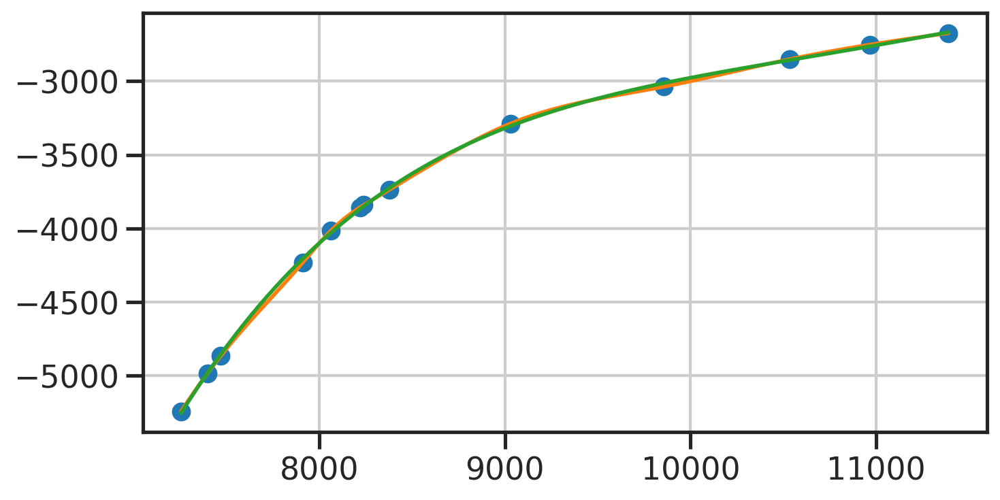

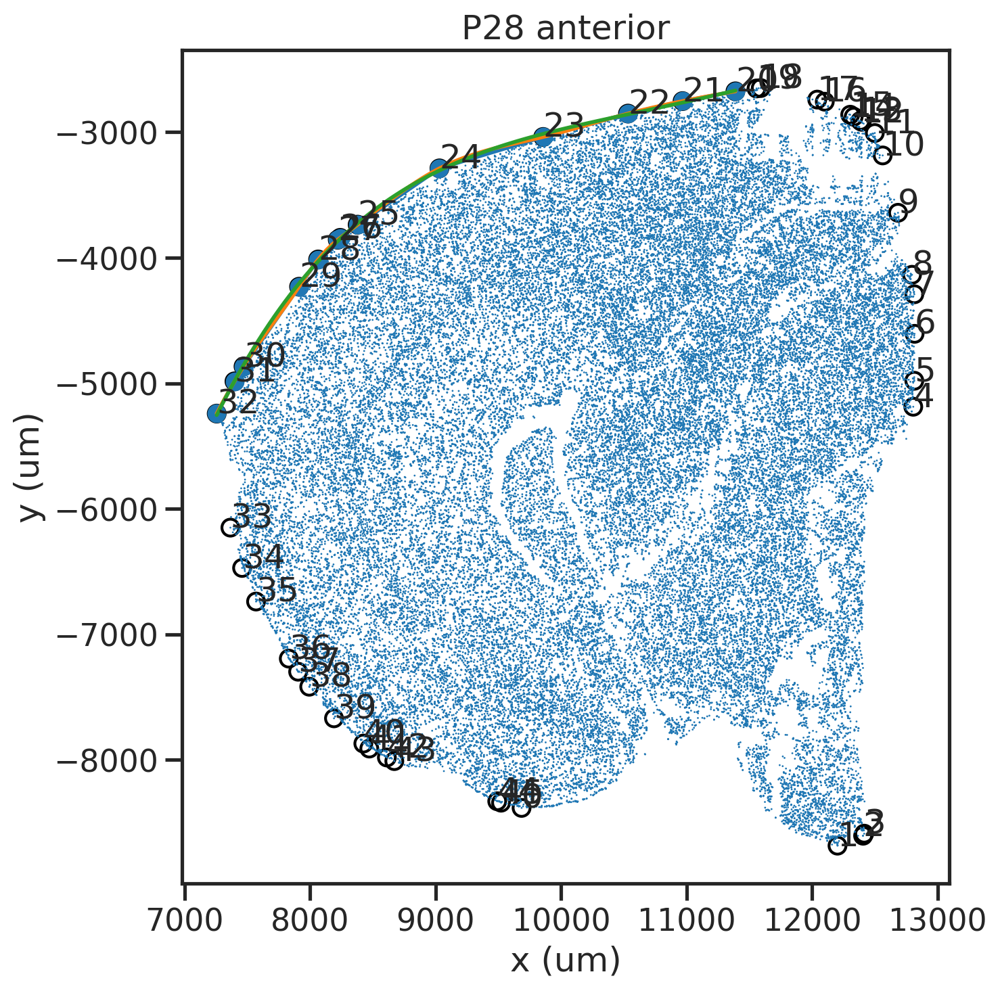

In [17]:
# Smooth using cubic spline interpolation
x_smooth = np.linspace(min(x), max(x), 100)
y_smooth = CubicSpline(x, y)(x_smooth)

# Generate x values for the fitted curve
coefficients = np.polyfit(x, y, 4)
poly_fit = np.poly1d(coefficients)
x_fit = np.linspace(min(x), max(x), 100)
y_fit = poly_fit(x_fit)

fig, ax = plt.subplots(figsize=(8,4))
plt.plot(x, y, 'o')    
plt.plot(x_smooth, y_smooth, '-', label='Smoothed (Cubic Spline)', linewidth=2)
plt.plot(x_fit, y_fit, '-', label='Smoothed (poly)', linewidth=2)
plt.show()
    


fig, ax = plt.subplots(figsize=(12,8))
for i, vtx in enumerate(hull.vertices):
    ax.scatter(XY[vtx, 0], XY[vtx, 1], facecolors='none', edgecolors='k')
    ax.text(XY[vtx, 0], XY[vtx, 1], i)
    
ax.plot(x, y, '-o', label='raw', linewidth=2)
ax.plot(x_smooth, y_smooth, '-', label='Smoothed (Cubic Spline)', linewidth=2)
ax.plot(x_fit, y_fit, '-', label='Smoothed (poly)', linewidth=2)
    
ax.scatter(XY[:,0], XY[:,1], edgecolor='none', s=1)

ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'P28 anterior')
plt.show()

In [18]:
## record
pia_curve_obj = RefLineSegs(pia_curve)

pia_curve_smooth = np.vstack([x_smooth, y_smooth]).T
pia_curve_smooth_obj = RefLineSegs(pia_curve_smooth)

pia_curve_fit = np.vstack([x_fit, y_fit]).T
pia_curve_fit_obj = RefLineSegs(pia_curve_fit)


# depth
meta['depth'] = pia_curve_fit_obj.ndist_to_qps(XY)
meta['width'] = pia_curve_fit_obj.tdist_to_qps(XY)

# bin it 
depth_bins, depth_binned = binning(meta['depth'].values, 20)
meta['depth_bin'] = depth_binned

width_bins, width_binned = binning(meta['width'].values, 20)
meta['width_bin'] = width_binned

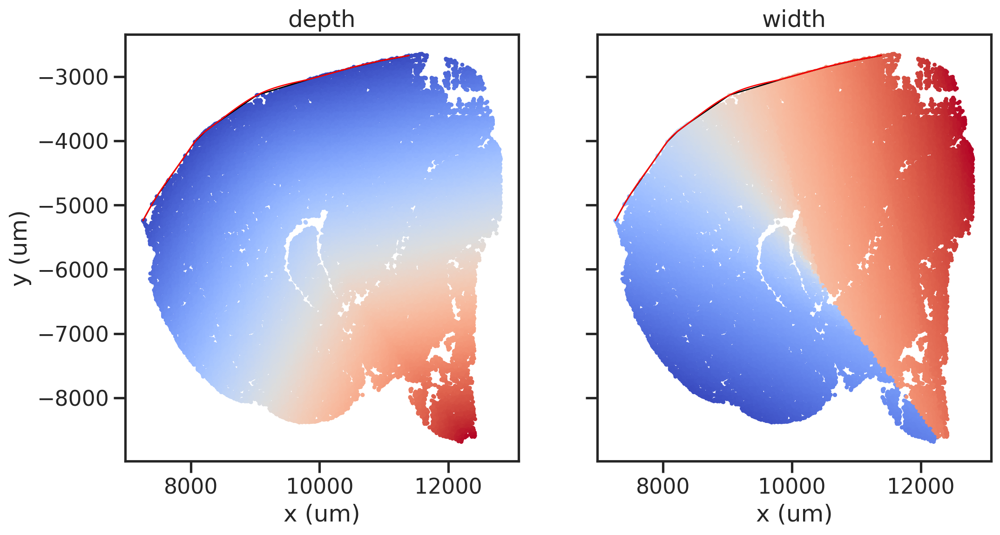

In [19]:
fig, axs = plt.subplots(1,2,figsize=(12,8*2), sharex=True, sharey=True)
ax = axs[0]
for ax, lbl in zip(axs, ['depth', 'width']):
    
    ax.plot(pia_curve[:,0], pia_curve[:,1], '-k', linewidth=1)
    ax.plot(x_smooth, y_smooth, '-r', linewidth=1)

    sns.scatterplot(data=meta, x='x', y='y', 
                    hue=lbl, 
                    palette='coolwarm',
                    legend=False,
                    s=10, edgecolor='none', ax=ax)
    ax.grid(False)
    ax.set_aspect('equal')
    ax.set_xlabel('x (um)')
    ax.set_ylabel('y (um)')
    ax.set_title(f'{lbl}')


Text(0.5, 1.0, 'width')

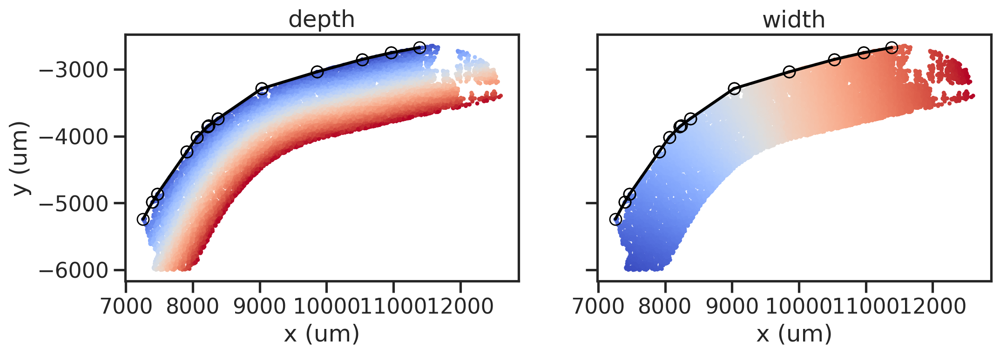

In [20]:
cond = np.all([
    meta['depth'] < 1000,
    # meta['width'] > 1000,
    # meta['width'] < 6000,
    meta['y'] >-6000, # 9000,
    ], axis=0)


fig, axs = plt.subplots(1,2,figsize=(12,8*2), sharex=True, sharey=True)
ax = axs[0]
    
for i in range(len(pia_curve)-1):
    ax.plot(pia_curve[i:i+2, 0], 
            pia_curve[i:i+2, 1], 
            '-ok', fillstyle='none')
    
sns.scatterplot(data=meta[cond], x='x', y='y', 
                hue='depth', 
                palette='coolwarm',
                legend=False,
                s=10, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'depth')

ax = axs[1]
for i in range(len(pia_curve)-1):
    ax.plot(pia_curve[i:i+2, 0], 
            pia_curve[i:i+2, 1], 
            '-ok', fillstyle='none')
    
sns.scatterplot(data=meta[cond], x='x', y='y', 
                hue='width', 
                palette='coolwarm',
                legend=False,
                s=10, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('x (um)')
ax.set_ylabel('y (um)')
ax.set_title(f'width')

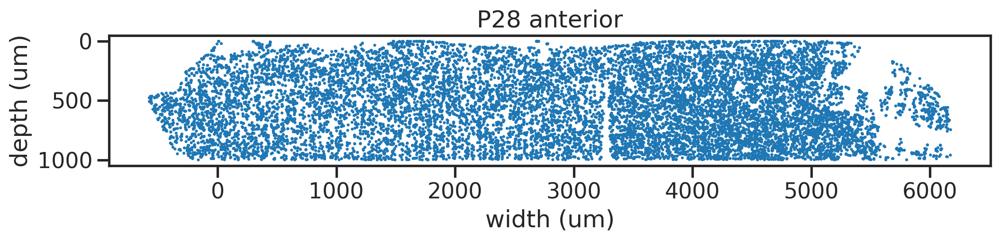

In [21]:
fig, ax = plt.subplots(1,1,figsize=(12,4*1))
sns.scatterplot(data=meta[cond], x='width', y='depth', 
                # hue='width', 
                # palette='coolwarm',
                s=5, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('width (um)')
ax.set_ylabel('depth (um)')
ax.set_title(f'P28 anterior')
ax.invert_yaxis()
# ax.legend(bbox_to_anchor=(1,1))

In [22]:
# save
xy_operations['ref_line'] = pia_curve_fit.tolist()
# xy_operations

# select cortex

In [23]:
adatasub2 = adatasub[cond].copy()
adatasub2.obs['depth'] = meta[cond]['depth']
adatasub2.obs['width'] = meta[cond]['width']
meta2 = adatasub2.obs

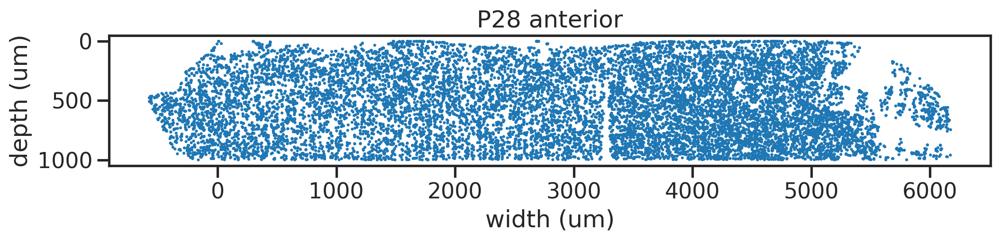

In [24]:
fig, ax = plt.subplots(1,1,figsize=(12,4*1))
sns.scatterplot(data=meta2, x='width', y='depth', 
                # hue='width', 
                # palette='coolwarm',
                s=5, edgecolor='none', ax=ax)
ax.grid(False)
ax.set_aspect('equal')
ax.set_xlabel('width (um)')
ax.set_ylabel('depth (um)')
ax.set_title(f'P28 anterior')
ax.invert_yaxis()
# ax.legend(bbox_to_anchor=(1,1))

# adata - norm - PCA UMAP clustering

220.63249478630863


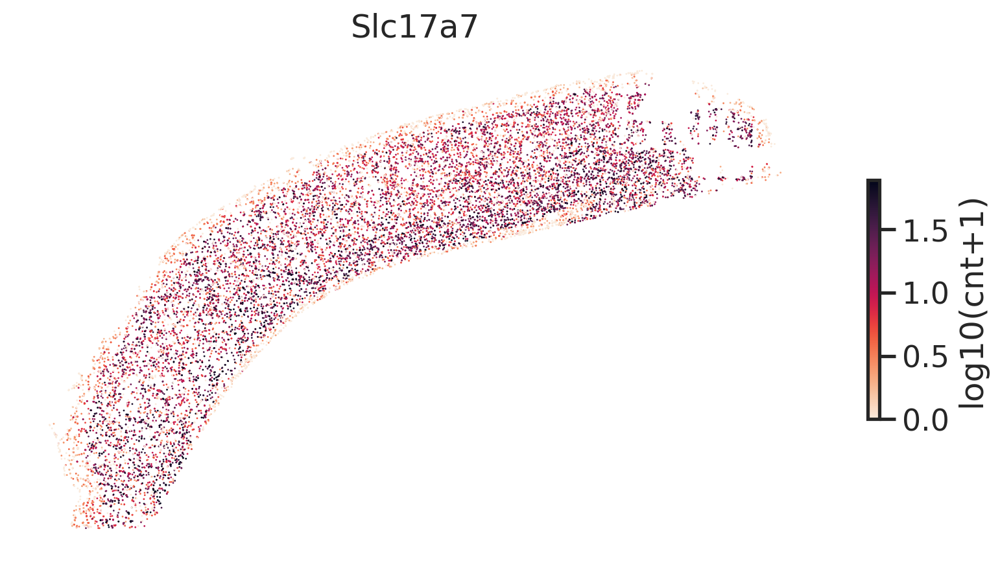

In [25]:

adata = adatasub2

# norm
cnts = adata.X
vol = adata.obs['volume'].values
medvol = np.median(vol)
print(medvol)

# equalize the volume to be 500 for all cells
scaling = 500
normcnts = cnts/vol.reshape(-1,1)*scaling
adata.layers['norm'] = normcnts

# check
gn = 'Slc17a7'
xr = adata.obs['x']
yr = adata.obs['y']
g = np.log10(1+adata[:,gn].layers['norm'])
st_scatter(xr, yr, gexp=g, title=gn, cbar_label='log10(cnt+1)', axis_off=True)
plt.show()


# PCA
pca = PCA(n_components=20)
pcs = pca.fit_transform(adata.layers['norm'])

# ucs = UMAP(n_components=2, n_neighbors=30, random_state=0).fit_transform(pcs)

adata.obsm['pca'] = pcs
# adata.obsm['umap'] = ucs

# sc.pp.neighbors(adata, n_neighbors=30, use_rep='pca', random_state=0)

# # clustering
# r = 0.1
# sc.tl.leiden(adata, resolution=r, key_added=f'leiden_r{r}', random_state=0, n_iterations=1)

# # plot
# gn = 'Slc17a7'
# g = np.log10(1+adata[:,gn].layers['norm']).reshape(-1,)

# st_scatter(xr[g>0], yr[g>0], gexp=g[g>0], title=gn, cbar_label='log10(cnt+1)', axis_off=True)
# st_scatter(pcs[:,0], pcs[:,1], gexp=g)
# st_scatter(ucs[:,0], ucs[:,1], gexp=g)

# clsts = adata.obs['leiden_r0.1'].astype(int)
# x     = adata.obs['x']
# y     = adata.obs['y']
# ux    = adata.obsm['umap'][:,0]
# uy    = adata.obsm['umap'][:,1]
# plot_cluster(clsts, x, y, ux, uy)

# Second round of QC 
- counts / volumes
- 

In [26]:
df = adata.obs

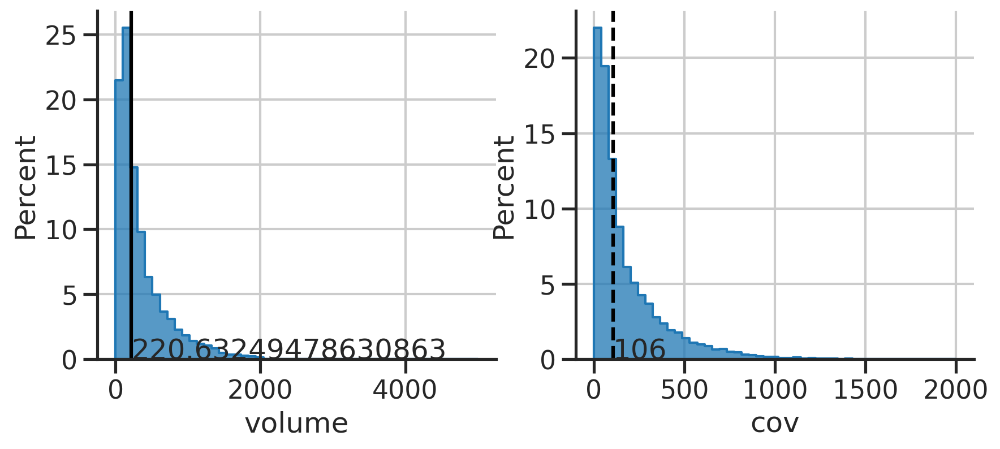

In [27]:
vol = df['volume'].values
medvol = np.median(vol)

cov = df['gncov'].values
medcov = np.median(cov)

fig, axs = plt.subplots(1,2,figsize=(2*5,1*4))
ax = axs[0]
sns.histplot(vol, element='step', bins=np.linspace(0,5000,50), ax=ax, stat='percent')
sns.despine(ax=ax)
ax.axvline(medvol, color='k',)
ax.text(medvol, 0, medvol)
ax.set_xlabel('volume')

ax = axs[1]
sns.histplot(cov, element='step', bins=np.linspace(0,2000,50), ax=ax, stat='percent')
sns.despine(ax=ax)
ax.text(medcov, 0, int(medcov))
ax.axvline(medcov, color='k', linestyle='--')
ax.set_xlabel('cov')
plt.show()

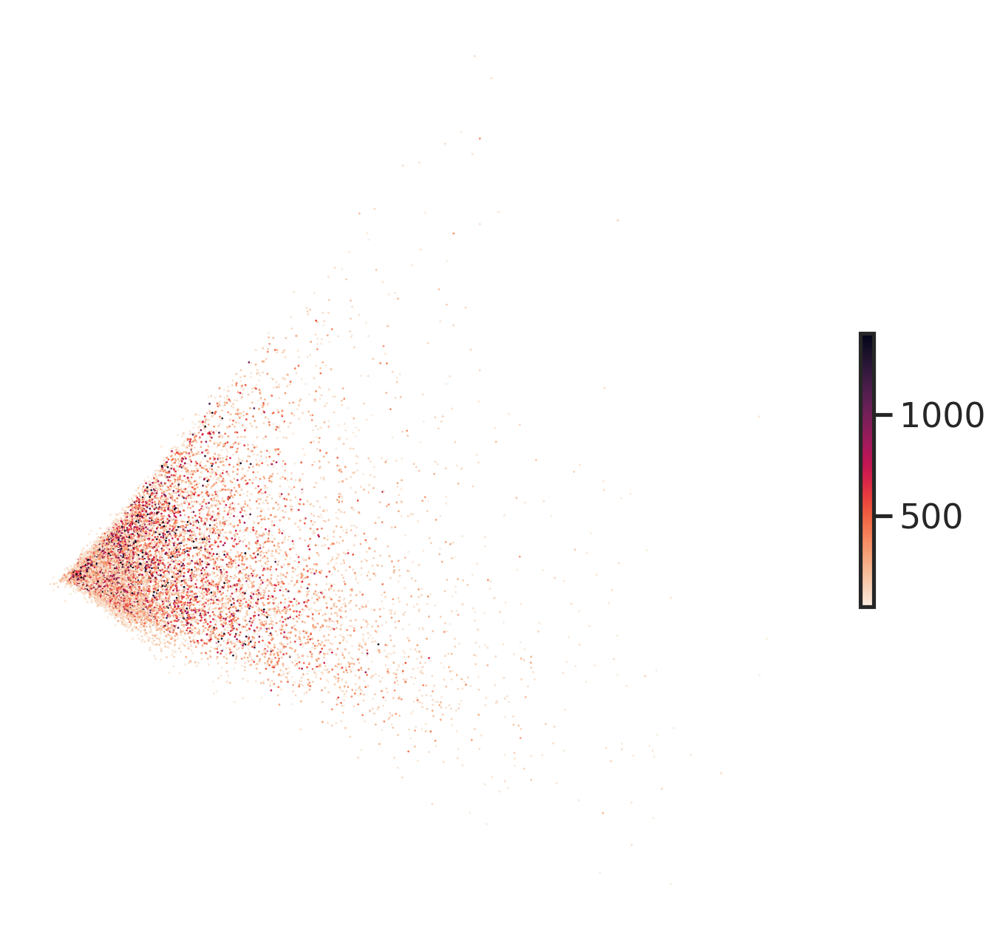

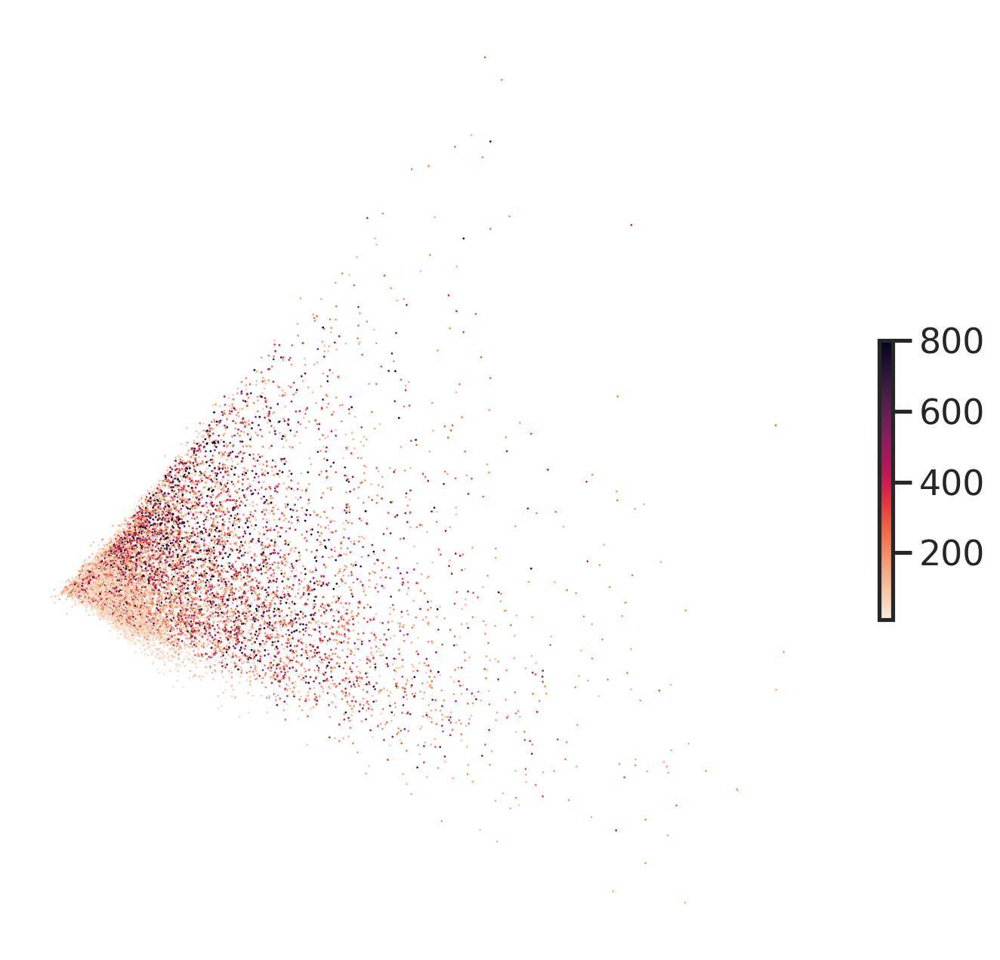

In [28]:
pcs = adata.obsm['pca']
st_scatter(pcs[:,0], pcs[:,1], gexp=vol)
# st_scatter(ux, uy, gexp=vol)

st_scatter(pcs[:,0], pcs[:,1], gexp=cov)
# st_scatter(ux, uy, gexp=cov)

In [29]:
print(output)
print(output_json)

/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DR_pos_ctxglut_240318.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DR_pos_ctxglut_240318_xy_operations.json


In [30]:
with open(output_json, 'w') as fh:
    json.dump(xy_operations, fh)

In [31]:
adata.write(output)